c:\Users\Alexandre\anaconda3\envs\spacex_rl\lib\site-packages\pygame\pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists


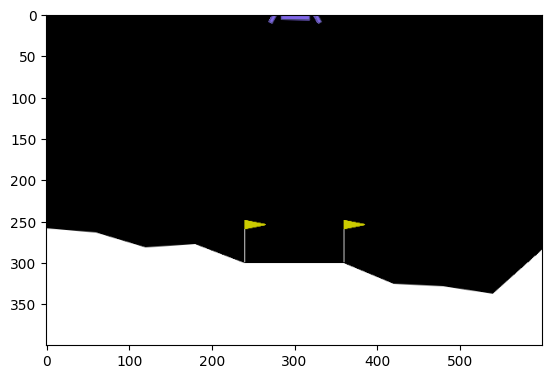

In [ ]:
import gymnasium as gym
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import display, HTML   # très important pour Jupyter

# ────────────────────────────────────────────────
env = gym.make("LunarLander-v3", render_mode="rgb_array")
observation, info = env.reset(seed=42)
frames = []

for _ in range(1000):
    action = env.action_space.sample()
    observation, reward, terminated, truncated, info = env.step(action)
    frames.append(env.render())
    if terminated or truncated:
        observation, info = env.reset()

env.close()

# ────────────────────────────────────────────────
# Création de l'animation
fig = plt.figure(figsize=(6, 6))           # taille raisonnable
plt.axis('off')

img = plt.imshow(frames[0])                 # premier frame

def animate(i):
    img.set_data(frames[i])                 # met à jour l'image
    return [img]

anim = animation.FuncAnimation(
    fig, 
    animate, 
    frames=len(frames), 
    interval=30,                            # ~33 fps → ajuste (20–50 ms)
    blit=True,                              # plus rapide
    repeat=True
)

# Affichage dans Jupyter / Colab
plt.close(fig)                              # évite d'afficher la figure statique
display(HTML(anim.to_jshtml()))

In [ ]:
import gymnasium as gym
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.callbacks import EvalCallback
from stable_baselines3.common.logger import configure

# Créer l'environnement vectorisé (pour parallélisme)
env = make_vec_env("LunarLander-v3", n_envs=4, seed=42)  # Mise à jour vers v3, ajout seed

# Logger pour TensorBoard
logger = configure("logs/", ["tensorboard"])
model = PPO("MlpPolicy", env, verbose=1, tensorboard_log="logs/ppo/", seed=42)  # Ajout seed
model.set_logger(logger)

# Callback pour évaluation périodique
eval_callback = EvalCallback(env, best_model_save_path="./logs/",
                             log_path="./logs/", eval_freq=10000,
                             deterministic=True, render=False)

# Entraîner
model.learn(total_timesteps=1000000, callback=eval_callback)  # 1M steps
# Sauvegarder le modèle final
model.save("ppo_lunar_lander")

In [ ]:
import gymnasium as gym
from stable_baselines3 import PPO
import numpy as np
import pandas as pd
import imageio.v3 as iio
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from datetime import datetime

MODEL_PATH = "ppo_lunar_lander"
N_EPISODES = 100
SUCCESS_THRESHOLD = 200
VERY_GOOD_THRESHOLD = 250

GIF_FOLDER = Path("gifs_evaluation")
GIF_FOLDER.mkdir(exist_ok=True)

GIF_EPISODES = [0, 5, 15, 30, 50, 70, 85]

def evaluate_episode(env, model, seed):
    obs, _ = env.reset(seed=seed)
    episode_reward = 0
    episode_length = 0
    frames = []
    actions_taken = []
    done = False
    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, terminated, truncated, _ = env.step(action)
        episode_reward += reward
        episode_length += 1
        frames.append(env.render())
        actions_taken.append(action)
        done = terminated or truncated
    is_success = episode_reward > SUCCESS_THRESHOLD
    is_perfect = episode_reward > VERY_GOOD_THRESHOLD
    is_crash = terminated and episode_reward < -50
    return {
        "reward": episode_reward,
        "length": episode_length,
        "success": is_success,
        "perfect": is_perfect,
        "crash": is_crash,
        "actions": actions_taken,
        "frames": frames if len(GIF_EPISODES) > 0 else None
    }

print(f"Évaluation du modèle sur {N_EPISODES} épisodes...")
env = gym.make("LunarLander-v3", render_mode="rgb_array")
model = PPO.load(MODEL_PATH)

results = []
saved_gifs = []

for i in range(N_EPISODES):
    seed = 42 + i * 7
    ep_data = evaluate_episode(env, model, seed)
    results.append(ep_data)
    if i in GIF_EPISODES:
        filename = GIF_FOLDER / f"episode_{i:03d}_reward_{ep_data['reward']:.0f}.gif"
        iio.imwrite(filename, ep_data["frames"], fps=30, loop=0)
        saved_gifs.append(str(filename))
        print(f"GIF sauvegardé : {filename}")

env.close()

df = pd.DataFrame(results)

mean_reward = df["reward"].mean()
std_reward = df["reward"].std()
success_rate = df["success"].mean()
perfect_rate = df["perfect"].mean()
crash_rate = df["crash"].mean()
avg_length = df["length"].mean()

print("\n" + "="*60)
print("RÉSULTATS GLOBAUX".center(60))
print("="*60)
print(f"Épisodes évalués          : {N_EPISODES}")
print(f"Reward moyen              : {mean_reward:.2f} ± {std_reward:.2f}")
print(f"Reward médian             : {df['reward'].median():.2f}")
print(f"Reward min / max          : {df['reward'].min():.2f} / {df['reward'].max():.2f}")
print(f"Durée moyenne épisode     : {avg_length:.1f} steps")
print(f"Taux de succès (> {SUCCESS_THRESHOLD})  : {success_rate:.2%} ({df['success'].sum()})")
print(f"Taux atterrissages parfaits (> {VERY_GOOD_THRESHOLD}) : {perfect_rate:.2%}")
print(f"Taux de crash             : {crash_rate:.2%} ({df['crash'].sum()})")

if df["success"].any():
    print(f"\nReward moyen (succès)     : {df[df['success']]['reward'].mean():.2f}")
if df["crash"].any():
    print(f"Reward moyen (crash)      : {df[df['crash']]['reward'].mean():.2f}")

sns.set_style("whitegrid")

plt.figure(figsize=(10, 6))
sns.histplot(df["reward"], kde=True, bins=25, color="cornflowerblue")
plt.axvline(SUCCESS_THRESHOLD, color="green", linestyle="--", label=f"Seuil succès ({SUCCESS_THRESHOLD})")
plt.axvline(VERY_GOOD_THRESHOLD, color="limegreen", linestyle="--", label=f"Parfait ({VERY_GOOD_THRESHOLD})")
plt.title("Distribution des récompenses")
plt.xlabel("Reward")
plt.ylabel("Fréquence")
plt.legend()
plt.savefig("reward_distribution.png", dpi=150)
plt.close()

plt.figure(figsize=(8, 5))
sns.boxplot(x="success", y="reward", data=df, palette=["salmon", "lightgreen"])
plt.title("Récompenses : Succès vs Échecs")
plt.xticks([0, 1], ["Échec / Crash", "Succès"])
plt.ylabel("Reward")
plt.savefig("boxplot_success_vs_fail.png", dpi=150)
plt.close()

plt.figure(figsize=(10, 6))
sns.scatterplot(x="length", y="reward", hue="success", data=df, palette=["salmon", "green"], alpha=0.7)
plt.axhline(SUCCESS_THRESHOLD, color="gray", linestyle="--")
plt.title("Reward vs Durée d'épisode")
plt.xlabel("Nombre de steps")
plt.ylabel("Reward")
plt.legend(title="Succès")
plt.savefig("scatter_reward_vs_length.png", dpi=150)
plt.close()

print("\nVisualisations sauvegardées :")
print(" - reward_distribution.png")
print(" - boxplot_success_vs_fail.png")
print(" - scatter_reward_vs_length.png")

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
csv_path = f"evaluation_results_{timestamp}.csv"
df.to_csv(csv_path, index=False)
print(f"\nRésultats détaillés exportés → {csv_path}")

summary = f"""Évaluation PPO LunarLander-v3 – {datetime.now().strftime('%Y-%m-%d %H:%M')}
-------------------------------------------
Épisodes : {N_EPISODES}
Reward moyen : {mean_reward:.2f} ± {std_reward:.2f}
Taux succès  : {success_rate:.2%} (> {SUCCESS_THRESHOLD})
Taux crash   : {crash_rate:.2%}

GIFs créés :
{chr(10).join(saved_gifs[:8]) if saved_gifs else "Aucun GIF créé (ajustez GIF_EPISODES)"}
"""

with open("evaluation_summary.txt", "w", encoding="utf-8") as f:
    f.write(summary)

print("Résumé court → evaluation_summary.txt")
print("Prêt pour README GitHub !")

Mean reward: 198.38
Std dev: 61.82
Success rate: 3.00%


In [ ]:
from scipy.stats import ttest_ind
success_rewards = df[df["success"]]["reward"]
fail_rewards = df[~df["success"]]["reward"]
t_stat, p_val = ttest_ind(success_rewards, fail_rewards)
print(f"Test t : p-value = {p_val:.2e} → différence significative")